In [4]:
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 26.1 MB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 121.6 MB/s eta 0:00:0000:010:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 88.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 51.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 35.3 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 15.0 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 9.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 93.9 MB/s eta 0:00:00:00:0100:01


In [5]:
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [1]:
import pandas as pd
import os
import shutil
from sklearn.model_selection import train_test_split
from tqdm.notebook import tqdm

# --- Configuration ---
# Update these paths if they differ
csv_path = '/kaggle/input/cctv-weapon-dataset/Dataset/annotation_sample.csv'
source_img_dir = '/kaggle/input/cctv-weapon-dataset/Dataset/images'
output_dir = '/kaggle/working/data'

# Class mapping (Update if you have more classes)
class_map = {
    'person': 0,
    'weapon': 1
}

# Create directories
for split in ['train', 'val']:
    for kind in ['images', 'labels']:
        os.makedirs(os.path.join(output_dir, split, kind), exist_ok=True)

# --- Processing ---
print("Reading CSV...")
df = pd.read_csv(csv_path)

# 1. Normalize Coordinates for YOLO
# YOLO format: class_id x_center y_center width height (all normalized 0-1)
df['x_center'] = (df['bbox_x'] + df['bbox_width'] / 2) / df['image_width']
df['y_center'] = (df['bbox_y'] + df['bbox_height'] / 2) / df['image_height']
df['w_norm'] = df['bbox_width'] / df['image_width']
df['h_norm'] = df['bbox_height'] / df['image_height']
df['class_id'] = df['label_name'].map(class_map)

# 2. Split by Unique Images (to avoid leakage)
unique_images = df['image_name'].unique()
train_imgs, val_imgs = train_test_split(unique_images, test_size=0.2, random_state=42)

def process_dataset(image_list, split_name):
    print(f"Processing {split_name} data...")
    for img_name in tqdm(image_list):
        # A. Copy Image
        src_img = os.path.join(source_img_dir, img_name)
        dst_img = os.path.join(output_dir, split_name, 'images', img_name)
        
        if os.path.exists(src_img):
            shutil.copy(src_img, dst_img)
        else:
            print(f"Warning: Image {img_name} not found.")
            continue
            
        # B. Create Label File
        img_data = df[df['image_name'] == img_name]
        label_file = os.path.splitext(img_name)[0] + '.txt'
        dst_label = os.path.join(output_dir, split_name, 'labels', label_file)
        
        # Write lines: class_id x_c y_c w h
        with open(dst_label, 'w') as f:
            for _, row in img_data.iterrows():
                line = f"{int(row['class_id'])} {row['x_center']:.6f} {row['y_center']:.6f} {row['w_norm']:.6f} {row['h_norm']:.6f}\n"
                f.write(line)

# Run processing
process_dataset(train_imgs, 'train')
process_dataset(val_imgs, 'val')

print(f"Dataset ready at: {output_dir}")

Reading CSV...
Processing train data...


  0%|          | 0/112 [00:00<?, ?it/s]

Processing val data...


  0%|          | 0/29 [00:00<?, ?it/s]

Dataset ready at: /kaggle/working/data


In [2]:
import yaml

data_config = {
    'path': '/kaggle/working/data', # Dataset root dir
    'train': 'train/images',
    'val': 'val/images',
    'nc': 2,               # Number of classes
    'names': ['person', 'weapon'] # Class names
}

with open('/kaggle/working/data/data.yaml', 'w') as f:
    yaml.dump(data_config, f)

print("data.yaml created!")

data.yaml created!


In [6]:
import os
from ultralytics import YOLO
import yaml

# --- 1. Configuration ---
# Path from your screenshot
yaml_path = '/kaggle/working/data/data.yaml'
project_dir = '/kaggle/working/training_results'

# --- 2. Fix YAML Paths (Absolute Paths are Safer) ---
# This ensures YOLO finds the images even if relative paths are confusing
with open(yaml_path, 'r') as f:
    data_config = yaml.safe_load(f)

# Update paths to be absolute
base_data_dir = os.path.dirname(yaml_path) # /kaggle/working/data
data_config['path'] = base_data_dir
data_config['train'] = 'train/images'
data_config['val'] = 'val/images'

# Save the fixed yaml
fixed_yaml_path = '/kaggle/working/data_fixed.yaml'
with open(fixed_yaml_path, 'w') as f:
    yaml.dump(data_config, f)

print(f"Configured training for: {data_config['names']}")

# --- 3. Train Model ---
# Changed to 'yolov8s.pt' (Detection) instead of Segmentation
# If you genuinely have segmentation masks, change this back to 'yolov8s-seg.pt'
model = YOLO('yolov8s.pt') 

results = model.train(
    data=fixed_yaml_path,
    project=project_dir,
    name='weapon_detection', # Name of the subfolder
    epochs=20,
    imgsz=640,
    batch=16,      # Set explicit batch size to avoid memory errors
    patience=10,   # Early stopping
    save=True,
    exist_ok=True,
    pretrained=True,
    optimizer='auto',
    verbose=True,
    seed=42
)

print(f"Training complete. Best model saved at: {project_dir}/weapon_detection/weights/best.pt")

Configured training for: ['person', 'weapon']
Ultralytics 8.3.241 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/data_fixed.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=weapon_detection, nbs=64, nms=False, opset=None, optimize=False, optimizer=aut

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all         29         54      0.963      0.865      0.928      0.621
                person         28         28      0.948          1      0.967      0.732
                weapon         26         26      0.979      0.731      0.889      0.511
Speed: 0.2ms preprocess, 4.7ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to /kaggle/working/training_results/weapon_detection
Training complete. Best model saved at: /kaggle/working/training_results/weapon_detection/weights/best.pt


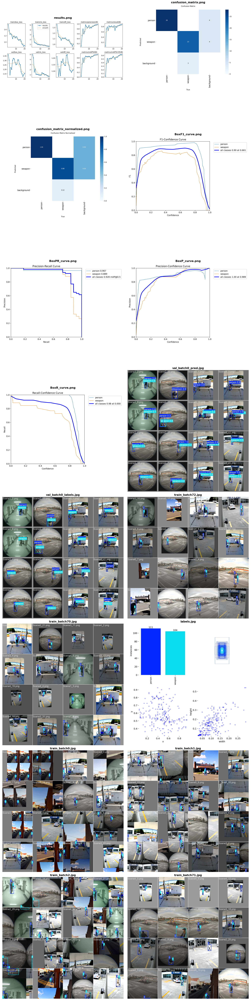

In [7]:
import os
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math

# 1. Setup Path (Adjust if your folder name is different)
# Based on your previous run, it should be here:
results_dir = '/kaggle/working/training_results/weapon_detection'

# 2. Collect Files
valid_extensions = ('.png', '.jpg', '.jpeg')
all_files = [f for f in os.listdir(results_dir) if f.lower().endswith(valid_extensions)]

# 3. Define "Professional Order"
# We want to see the Summary -> Confusion Matrix -> Curves -> Real Examples
priority_order = [
    'results.png',
    'confusion_matrix.png',
    'confusion_matrix_normalized.png',
    'BoxF1_curve.png',
    'BoxPR_curve.png',
    'BoxP_curve.png',
    'BoxR_curve.png',
    'val_batch0_pred.jpg',  # Critical: Shows model predictions
    'val_batch0_labels.jpg' # Critical: Shows ground truth
]

# Sort files: Priority ones first, then alphabetical for the rest
sorted_files = sorted(all_files, key=lambda x: priority_order.index(x) if x in priority_order else 999)

# 4. Display Logic
cols = 2  # 2 Images per row looks best for reports
rows = math.ceil(len(sorted_files) / cols)

plt.figure(figsize=(20, 10 * rows)) # Dynamic height

for i, filename in enumerate(sorted_files):
    img_path = os.path.join(results_dir, filename)
    img = mpimg.imread(img_path)
    
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(filename, fontsize=16, fontweight='bold')
    plt.axis('off') # Turn off axis numbers for cleaner look

plt.tight_layout()
plt.show()